#  0.Import spatial data in AnnData and Squidpy

This tutorial shows how to store spatial datasets in anndata.AnnData.

Spatial molecular data comes in many different formats, and to date there is no one-size-fit-all solution for reading spatial data in Python. Scanpy already provides a solution for Visium Spatial transcriptomics data with the function scanpy.read_visium() but that is basically it. Here in Squidpy, we do provide some pre-processed (and pre-formatted) datasets, with the module squidpy.datasets but it’s not very useful for the users who need to import their own data.

In this tutorial, we will showcase how spatial data are stored in anndata.AnnData. We will use mock datasets for this purpose, yet showing with examples the important details that you should take care of in order to exploit the full functionality of the AnnData-Scanpy-Squidpy ecosystem.

In [2]:
from numpy.random import default_rng

import matplotlib.pyplot as plt

import scanpy as sc
import squidpy as sq
from anndata import AnnData

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")

scanpy==1.10.1 anndata==0.10.6 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11
squidpy==1.4.1


In [3]:
# To solve the problem on server 

import matplotlib.pyplot as plt
import numpy as np

# 验证库版本
import scanpy as sc
print("scanpy version:", sc.__version__)
import squidpy as sq
print("squidpy version:", sq.__version__)
import matplotlib
print("matplotlib version:", matplotlib.__version__)

# 确保可以成功导入
from matplotlib.cm import get_cmap


scanpy version: 1.10.1
squidpy version: 1.4.1
matplotlib version: 3.8.3


## Spatial coordinates in AnnData

First, let’s generate some data. We will need:

* an array of features (e.g. counts).

* an array of spatial coordinates.

* an image array (e.g. the tissue image).

In [19]:
rng = default_rng(42)
counts = rng.integers(0, 15, size=(10, 100))  # feature matrix
coordinates = rng.uniform(0, 10, size=(10, 2))  # spatial coordinates
image = rng.uniform(0, 1, size=(10, 10, 3))  # image

### To create the anndata.AnnData object at first

We will first just use the count matrix and the spatial coordinates. 

Specify the anndata.AnnData.obsm key as 'spatial' is not strictly necessary but will save you a lot of typing since it’s the default for both Squidpy and Scanpy.

In [20]:
adata = AnnData(counts, obsm={"spatial": coordinates})

In [21]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)
adata

/var/folders/jr/_zfwrj454c3f3p40k5y7ccdh0000gn/T/ipykernel_4082/3950005224.py:6: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


AnnData object with n_obs × n_vars = 10 × 100
    obs: 'leiden'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

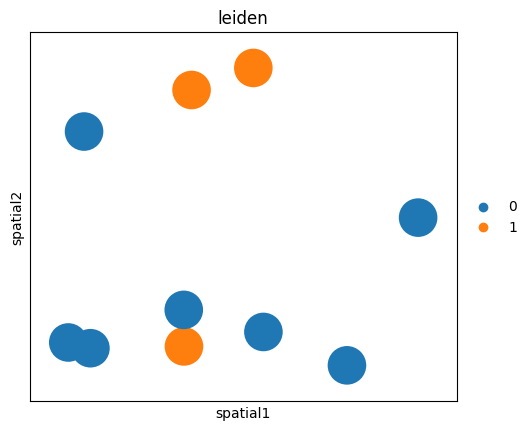

In [22]:
# Using scanpy

sc.pl.spatial(adata, color="leiden", spot_size =1)

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


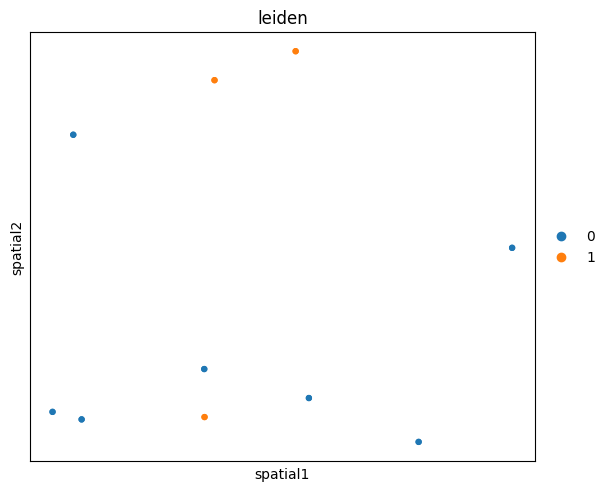

In [23]:
sq.pl.spatial_scatter(adata, shape=None, color="leiden", size=50)

## Tissue image in AnnData

If there is no tissue image, using Scanpy/Squidpy for the analysis. 

For instance, you can compute a spatial graph with squidpy.gr.spatial_neighbors() based on a fixed neighbor radius that is informative given your experimental settings.

In [24]:
adata


AnnData object with n_obs × n_vars = 10 × 100
    obs: 'leiden'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


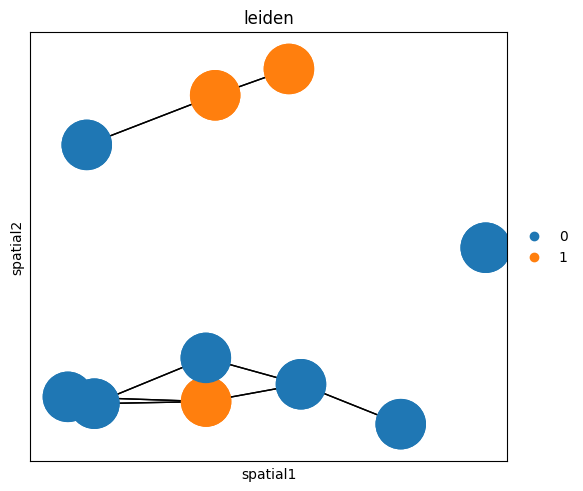

In [25]:
sq.gr.spatial_neighbors(adata, radius=3.0)
sq.pl.spatial_scatter(
    adata,
    color="leiden",
    connectivity_key="spatial_connectivities",
    edges_color="black",
    shape=None,
    edges_width=1,
    size=5000,
)

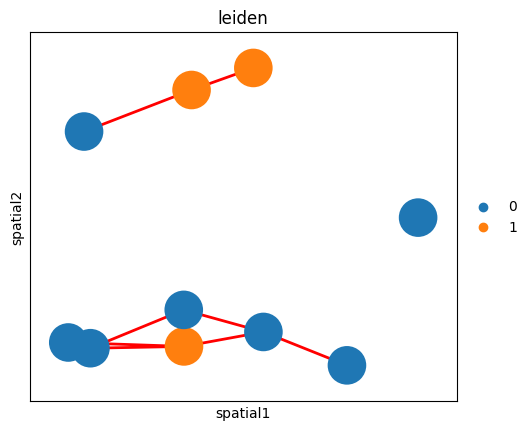

In [26]:
sc.pl.spatial(adata, color="leiden", neighbors_key="spatial_neighbors", edges=True, edges_color="red", edges_width=2, spot_size=1)

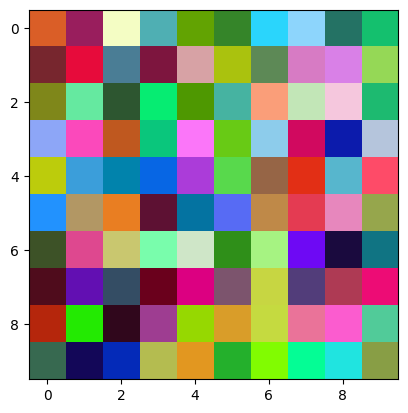

In [27]:
plt.imshow(image)

The image and its metadata are stored in the **uns** slot of **anndata.AnnData**. Specifically, in the **adata.uns['spatial'][<library_id>]** slot, where library_id is any unique key that refers to the tissue image.

For now, we will assume that there is only one image. This is the necessary metadata:

* **tissue_hires_scalef** - this is the scale factor between the spatial coordinates units and the image pixels.
 
 In the case of Visium, this is usually ~0.17. 
 
 In this case, we assume that the spatial coordinates are in the same scale of the pixels, and so we will set this value to 1.

* **spot_diameter_fullres** - this is the diameter of the capture area for each observation. In the case of Visium, we usually call them "spots" and this value is set to ~89.

Here, we will set it to 0.5.



In [28]:
adata

AnnData object with n_obs × n_vars = 10 × 100
    obs: 'leiden'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'spatial_neighbors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'

In [29]:
spatial_key = "spatial"
library_id = "tissue42"
adata.uns[spatial_key] = {library_id: {}}
adata.uns[spatial_key][library_id]["images"] = {}
adata.uns[spatial_key][library_id]["images"] = {"hires": image}
adata.uns[spatial_key][library_id]["scalefactors"] = {
    "tissue_hires_scalef": 1,
    "spot_diameter_fullres": 0.5,
}

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


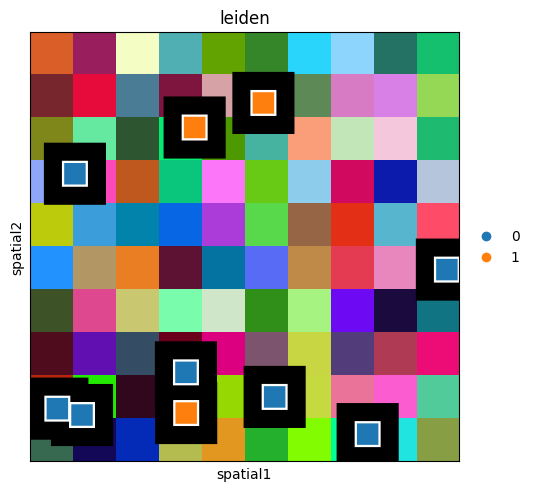

In [30]:
sq.pl.spatial_scatter(adata, color="leiden", shape="square", outline=True)

You can fiddle around with the settings to see what changes. 

For instance, let’s change **tissue_hires_scalef** to half the previous value.

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


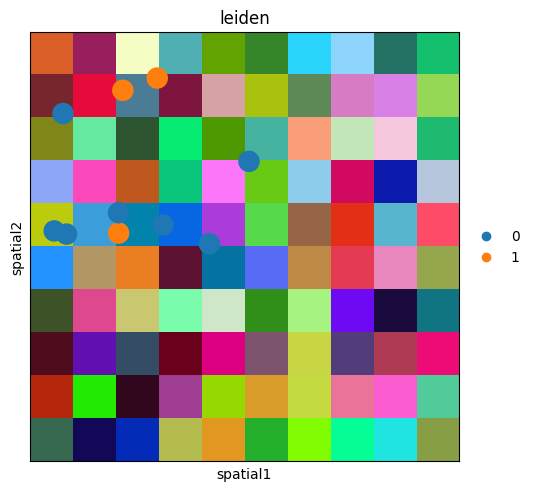

In [31]:
adata.uns[spatial_key][library_id]["scalefactors"] = {
    "tissue_hires_scalef": 0.5,
    "spot_diameter_fullres": 0.5,
}
sq.pl.spatial_scatter(adata, color="leiden", size=2)

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


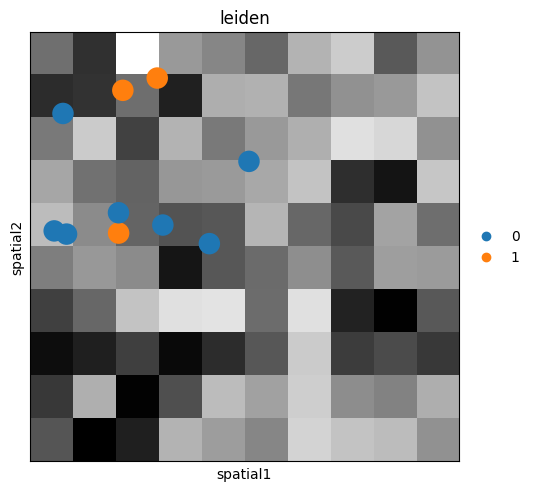

In [32]:
sq.pl.spatial_scatter(adata, color="leiden", img_cmap="gray", size=2)  #cmap=colormap

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


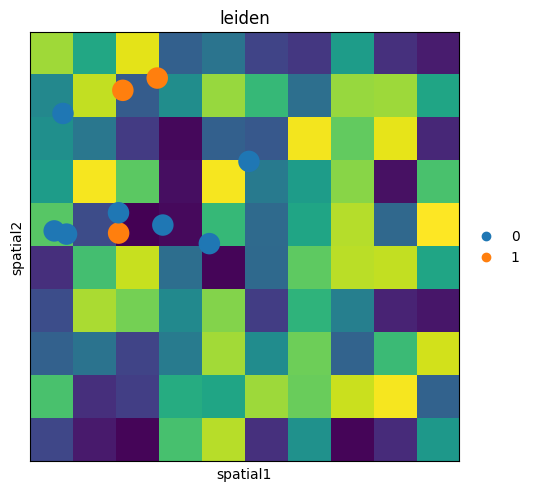

In [33]:
sq.pl.spatial_scatter(adata, color="leiden", img_channel=0, size=2)

In [34]:
image.shape

(10, 10, 3)

As you can see, the spatial coordinates have been scaled down, and the image was “zoomed in”.

Of course, you might want to “analyze” such image. **squidpy.im.ImageContainer** comes to the rescue! 

Just instantiate a new object and it will work out of the box

In [37]:
img["image"]

<xarray.DataArray 'image' (y: 10, x: 10, z: 1, channels: 3)>
array([[[[0.85654802, 0.37226157, 0.1536129 ]],

        [[0.60084041, 0.11967256, 0.36491936]],

        [[0.95842918, 0.99546447, 0.77210489]],

        [[0.31096151, 0.68766505, 0.70540637]],

        [[0.3878417 , 0.64088863, 0.01072764]],

        [[0.20905766, 0.5250883 , 0.1637513 ]],

        [[0.16590687, 0.83630429, 0.989133  ]],

        [[0.55596943, 0.83906973, 0.99032166]],

        [[0.14159589, 0.44824561, 0.39257272]],

        [[0.08004928, 0.75533017, 0.43377903]]],

...

       [[[0.2163557 , 0.41402609, 0.31763563]],

        [[0.07810839, 0.02983477, 0.34647866]],

        [[0.01903415, 0.16548776, 0.72518332]],

        [[0.70809124, 0.73858039, 0.31715317]],

        [[0.89001946, 0.59383055, 0.12602634]],

        [[0.14371866, 0.69309543, 0.17294394]],

        [[0.5072927 , 0.99177448, 0.0040076 ]],

        [[0.0165798 , 0.99308458, 0.58463883]],

        [[0.12690998, 0.8973022 , 0.8803803 ]],

        [[0.53620041, 0.62179203, 0.27318719]]]])
Coordinates:
  * z        (z) <U1 '0'
Dimensions without coordinates: y, x, channels

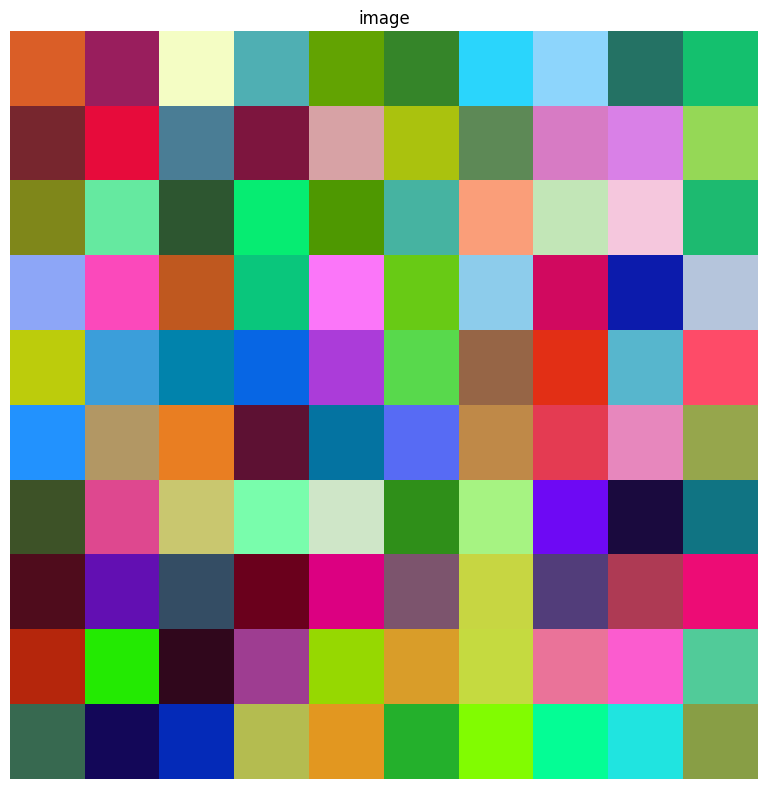

In [36]:
img = sq.im.ImageContainer(image)
img.show()

# 1.Using scanpy to analysis and visualize spatial transcriptomics data



In [66]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [67]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.10.6
scanpy      1.10.1
-----
PIL                         10.2.0
appnope                     0.1.4
asciitree                   NA
asttokens                   NA
attr                        23.2.0
certifi                     2024.02.02
cffi                        1.16.0
chardet                     5.2.0
charset_normalizer          3.3.2
cloudpickle                 3.0.0
comm                        0.2.1
cycler                      0.12.1
cython_runtime              NA
dask                        2024.5.0
dask_expr                   1.1.0
dask_image                  2023.08.1
datashader                  0.16.1
datatree                    0.0.14
dateutil                    2.8.2
debugpy                     1.8.1
decorator                   5.1.1
docrep                      0.3.2
exceptiongroup              1.2.0
executing                   2.0.1
fsspec                      2023.6.0
geopandas                   0.14.4
h5py                        3.10.0
idna              

In [68]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

reading /Users/rabbit/Desktop/MorphoPhen Dissertation/Spatial transcriptomic/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:02)


/Users/rabbit/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [69]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

## QC and preprocessing

To do the basic filtering of spots based on total counts and expressed genes

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

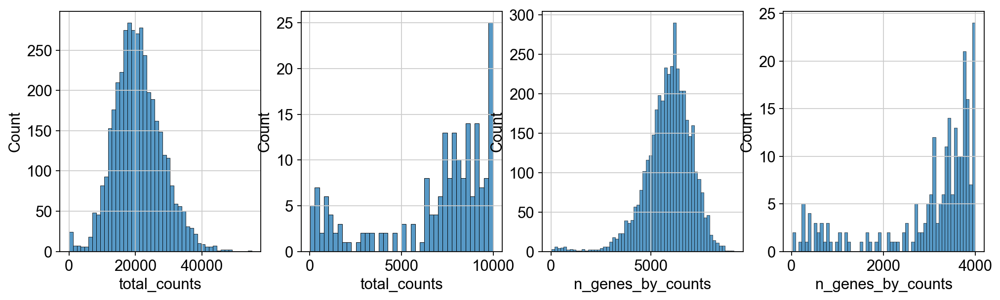

In [70]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [71]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 44 cells that have less than 5000 counts
filtered out 130 cells that have more than 35000 counts
#cells after MT filter: 3861
filtered out 16916 genes that are detected in less than 10 cells


We proceed to normalize Visium counts data with the built-in **normalize_total** method from Scanpy, and detect highly-variable genes (for later). 

In [72]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Manifold embedding and clustering based on transcriptional similarity

To embed and cluster the manifold encoded by transcriptional similarity, we proceed as in the standard clustering tutorial.

In [73]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
)

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes

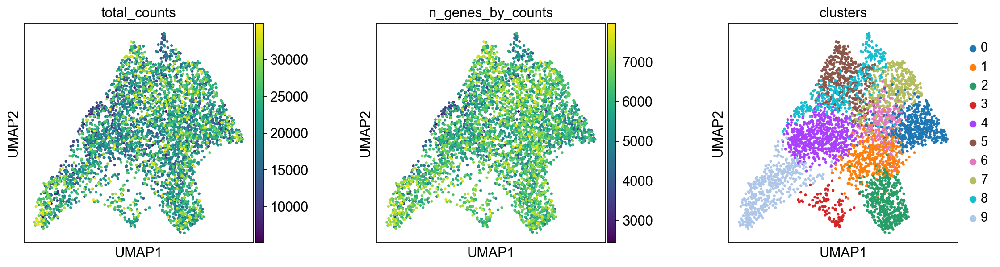

In [74]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

## Visualization in spatial coordinates

Let us now take a look at how **total_counts** and **n_genes_by_counts** behave in spatial coordinates. We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided, using the function **sc.pl.spatial**.

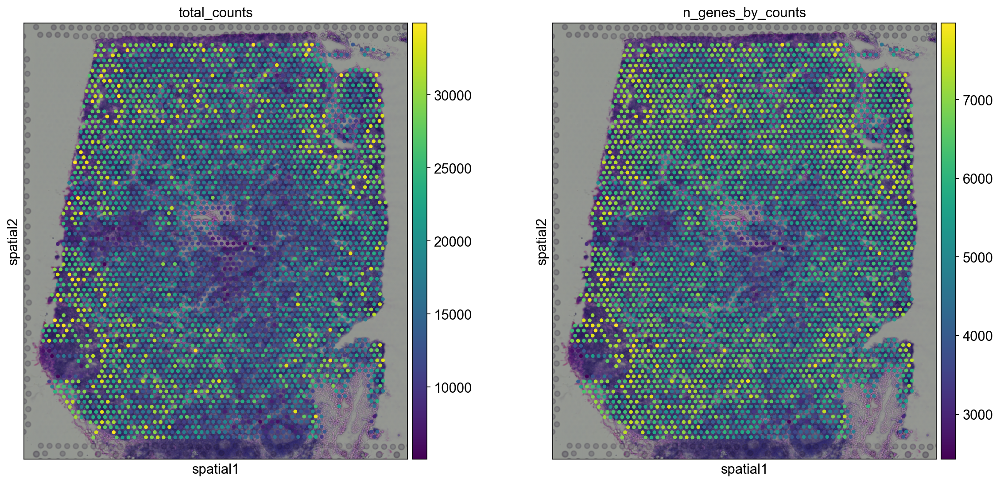

In [75]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

The function sc.pl.spatial accepts 4 additional parameters:

* img_key: key where the img is stored in the adata.uns element

* crop_coord: coordinates to use for cropping (left, right, top, bottom)

* alpha_img: alpha value for the transcparency of the image

* bw: flag to convert the image into gray scale

Furthermore, in sc.pl.spatial, the size parameter changes its behaviour: it becomes a scaling factor for the spot sizes.

Before, we performed clustering in gene expression space, and visualized the results with UMAP. By visualizing clustered samples in spatial dimensions, we can gain insights into tissue organization and, potentially, into inter-cellular communication.

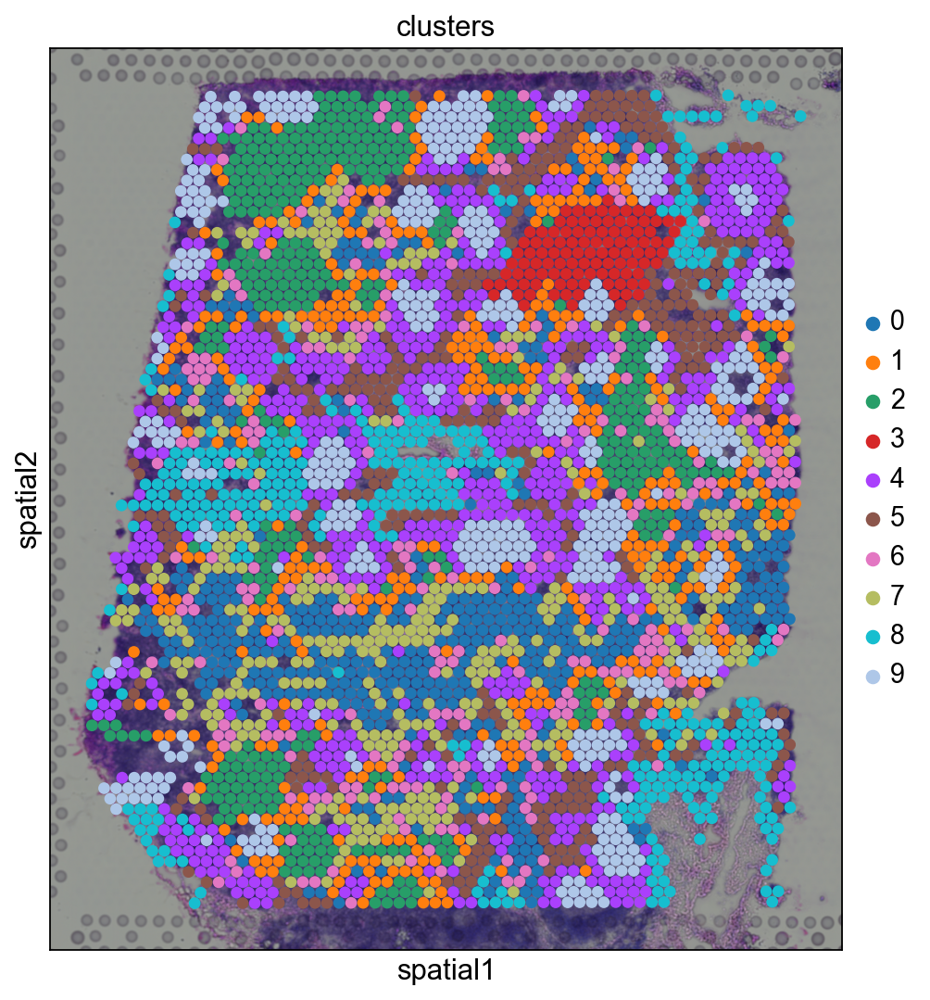

In [76]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

Spots belonging to the same cluster in gene expression space often co-occur in spatial dimensions. For instance, spots belonging to cluster 5 are often surrounded by spots belonging to cluster 0.

We can zoom in specific regions of interests to gain qualitative insights. Furthermore, by changing the alpha values of the spots, we can visualize better the underlying tissue morphology from the H&E image.

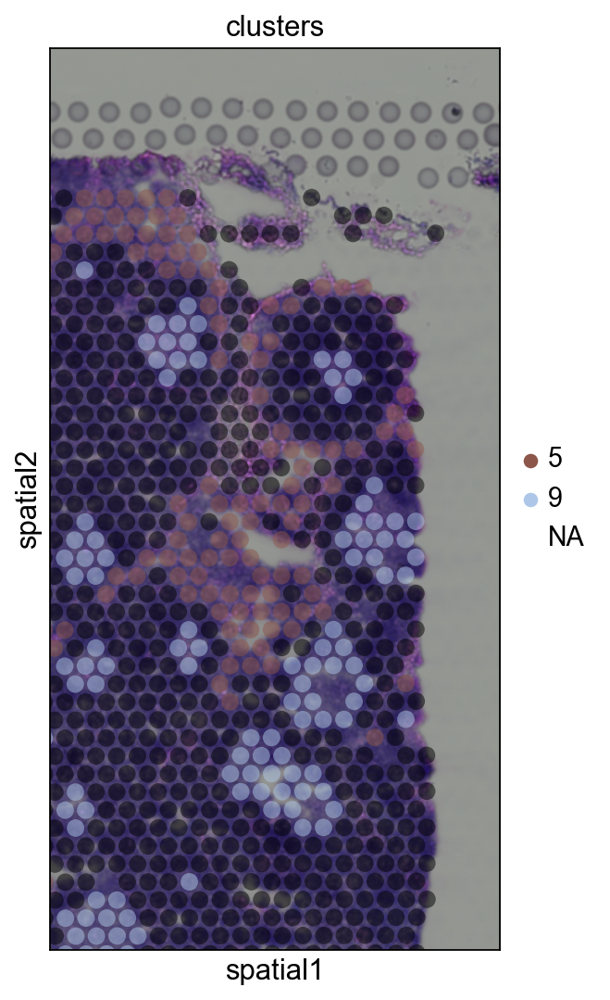

In [77]:
sc.pl.spatial(
    adata,
    img_key="hires",
    color="clusters",
    groups=["5", "9"],
    crop_coord=[7000, 10000, 0, 6000],
    alpha=0.5,
    size=1.3,
)

## Cluster marker genes

et us further inspect cluster 5, which occurs in small groups of spots across the image.

Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 9


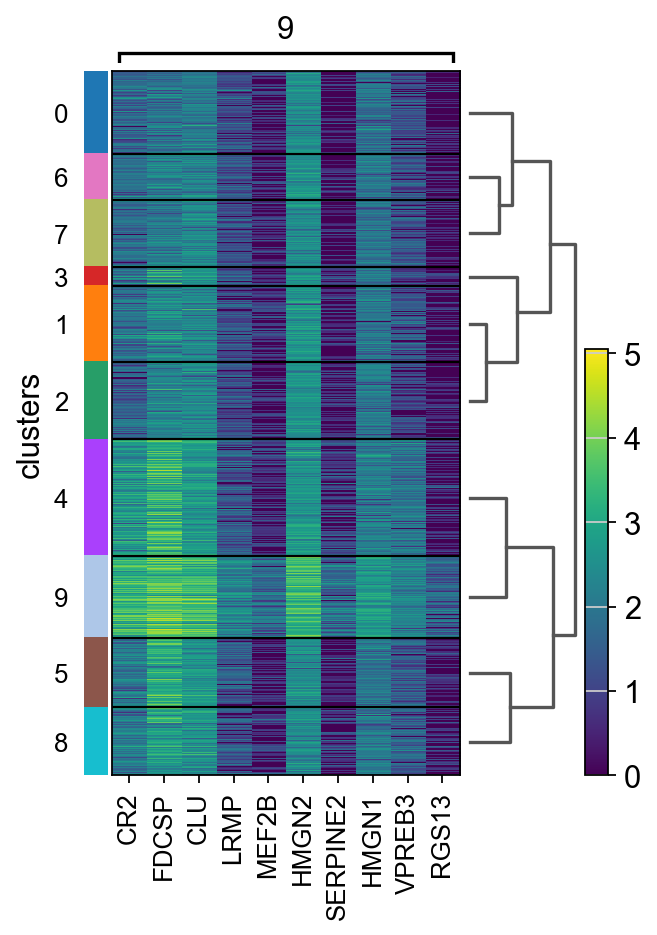

In [78]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="9", n_genes=10, groupby="clusters")

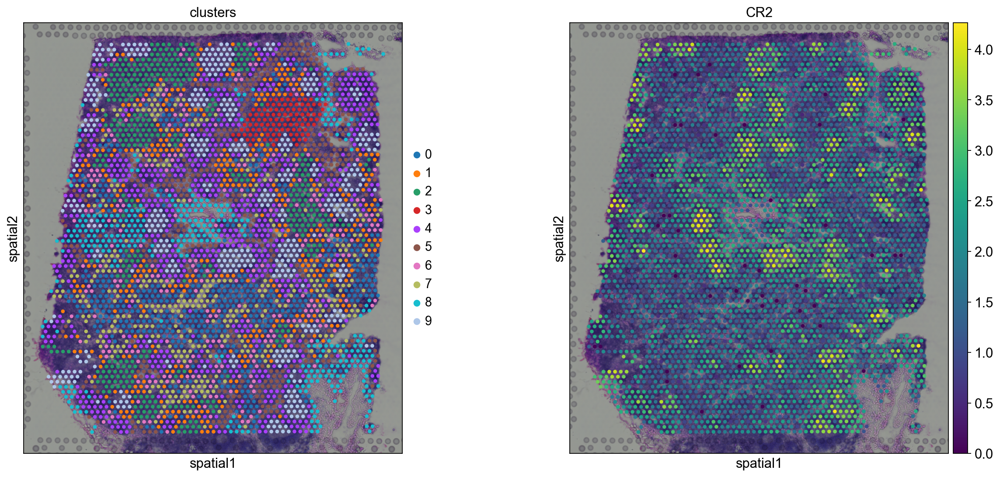

In [79]:
# We see that CR2 recapitulates the spatial structure.

sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])

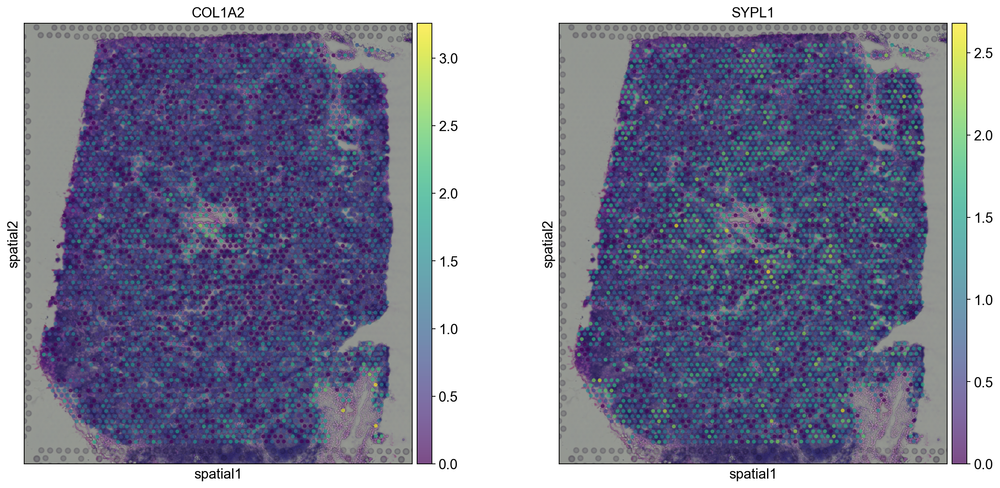

In [80]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)

# 2.Analyze Visium H&E data

This tutorial shows how to apply Squidpy for the analysis of Visium spatial transcriptomics data.

The dataset used here consists of a Visium slide of a coronal section of the mouse brain. The original dataset is publicly available at the 10x Genomics dataset portal <https://support.10xgenomics.com/spatial-gene-expression/datasets>_ . Here, we provide a pre-processed dataset, with pre-annotated clusters, in AnnData format and the tissue image in squidpy.im.ImageContainer format.

In [10]:
import numpy as np
import pandas as pd

import anndata as ad
import scanpy as sc
import squidpy as sq

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")


scanpy==1.10.1 anndata==0.10.6 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11
squidpy==1.4.1


In [4]:
# load the pre-processed dataset
img = sq.datasets.visium_hne_image()
adata = sq.datasets.visium_hne_adata()

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


## Visualize cluster annotation

First, let’s visualize cluster annotation in spatial context with **squidpy.pl.spatial_scatter()**.

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


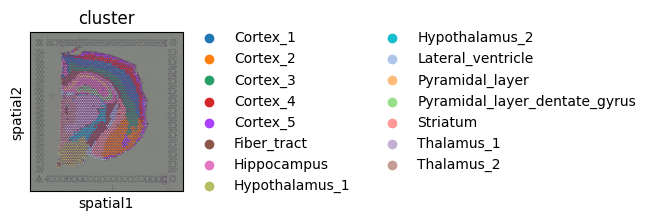

In [5]:
sq.pl.spatial_scatter(adata, color="cluster")

In [6]:
adata

AnnData object with n_obs × n_vars = 2688 × 18078
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
print(adata.uns['spatial'].keys())

dict_keys(['V1_Adult_Mouse_Brain'])


In [8]:
library_id = "V1_Adult_Mouse_Brain"
img = sq.im.ImageContainer(
    adata.uns['spatial'][library_id]["images"]['hires'],
    scale=adata.uns['spatial'][library_id]["scalefactors"]["tissue_hires_scalef"],
)

## Image features

Visium datasets contain high-resolution images of the tissue that was used for the gene extraction. 

Using the function **squidpy.im.calculate_image_features()** you can calculate image features for each Visium spot and create a **obs x features** matrix in **adata** that can then be analyzed together with the **obs x gene** gene expression matrix.

By extracting image features we are aiming to get both similar and complementary information to the gene expression values. Similar information is for example present in the case of a tissue with two different cell types whose morphology is different. 

Such cell type information is then contained in both the gene expression values and the tissue image features.

Squidpy contains several feature extractors and a flexible pipeline of calculating features of different scales and sizes. There are several detailed examples of how to use **squidpy.im.calculate_image_features()**. Extract image features provides a good starting point for learning more.

Here, we will extract **summary** features at different crop sizes and scales to allow the calculation of multi-scale features and **segmentation** features. For more information on the summary features, also refer to Extract summary features.

In [11]:
# calculate features for different scales (higher value means more context)
for scale in [1.0, 2.0]:
    feature_name = f"features_summary_scale{scale}"
    sq.im.calculate_image_features(
        adata,
        img.compute(),
        features="summary",
        key_added=feature_name,
        n_jobs=4,
        scale=scale,
    )


# combine features in one dataframe
adata.obsm["features"] = pd.concat(
    [adata.obsm[f] for f in adata.obsm.keys() if "features_summary" in f],
    axis="columns",
)
# make sure that we have no duplicated feature names in the combined table
adata.obsm["features"].columns = ad.utils.make_index_unique(
    adata.obsm["features"].columns
)

  0%|          | 0/2688 [00:00<?, ?/s]

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, plea

  0%|          | 0/2688 [00:00<?, ?/s]

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, plea

In [12]:
adata.obsm['features'].shape

# 2688: the number of set of spots; 30: the total number of features

(2688, 30)

### Extract image features

We can use the extracted image features to compute a new cluster annotation (**cluster_features**).

 This could be useful to gain insights in similarities across spots based on image morphology.

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/anndata/utils.py:292: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")
/var/folders/jr/_zfwrj454c3f3p40k5y7ccdh0000gn/T/ipykernel_86978/3320298302.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-pack

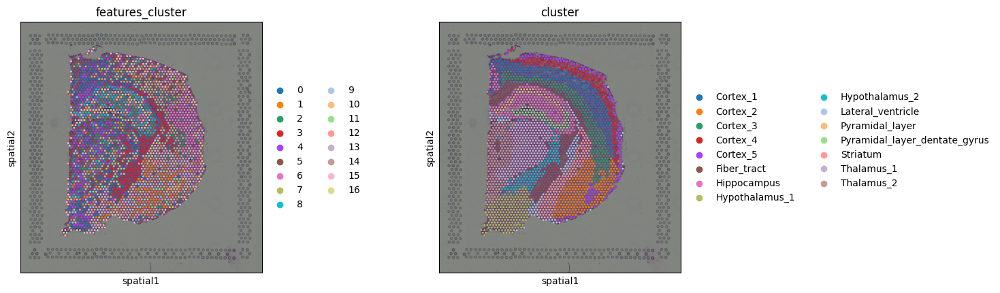

In [13]:
# helper function returning a clustering
def cluster_features(features: pd.DataFrame, like=None) -> pd.Series:
    """
    Calculate leiden clustering of features.

    Specify filter of features using `like`.
    """
    # filter features
    if like is not None:
        features = features.filter(like=like)
    # create temporary adata to calculate the clustering
    adata = ad.AnnData(features)
    # important - feature values are not scaled, so need to scale them before PCA
    sc.pp.scale(adata)
    # calculate leiden clustering
    sc.pp.pca(adata, n_comps=min(10, features.shape[1] - 1))
    sc.pp.neighbors(adata)
    sc.tl.leiden(adata)

    return adata.obs["leiden"]


# calculate feature clusters
adata.obs["features_cluster"] = cluster_features(adata.obsm["features"], like="summary")

# compare feature and gene clusters
sq.pl.spatial_scatter(adata, color=["features_cluster", "cluster"])

#### Interpretion of these two pictures
Comparing gene and feature clusters, we notice that in some regions, they look very similar, like the cluster **Fiber_tract**, or clusters around the **Hippocampus** seems to be roughly recapitulated by the clusters in image feature space. 

In others, the feature clusters look different, like in the **cortex**, where the gene clusters show the layered structure of the cortex, and the features clusters rather seem to show different regions of the cortex.

### Exercise

Compute a joint clustering on image and gexp features and plot it. How did the clustering change?

```python
adata_img =ad.AnnData(adata.obsm["features"])
sc.pp.neighbors(adata_img)
joint_adj=adata_img.obsp["connectivities"] + adata.obsp["connectivities"]
sc.tl.leiden(adata, adjacency=joint_adj, key_added="joint_leiden")
and plot with sq.pl.spatial_scatter
```

Then, do the same with the spatial graph. Tip: scale **spatial_connectivities** a bit(eg by 0.3)

Which tool does this analysis remind you of?

* This method sometime helps for plotting a good spatial graph, and be used in one recent paper.

In [14]:
adata_img =ad.AnnData(adata.obsm["features"])
sc.pp.neighbors(adata_img)
joint_adj=adata_img.obsp["connectivities"] + adata.obsp["connectivities"]
sc.tl.leiden(adata, adjacency=joint_adj, key_added="joint_leiden")

# combined the image features graph and gene expression similarities

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/anndata/utils.py:292: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")


/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


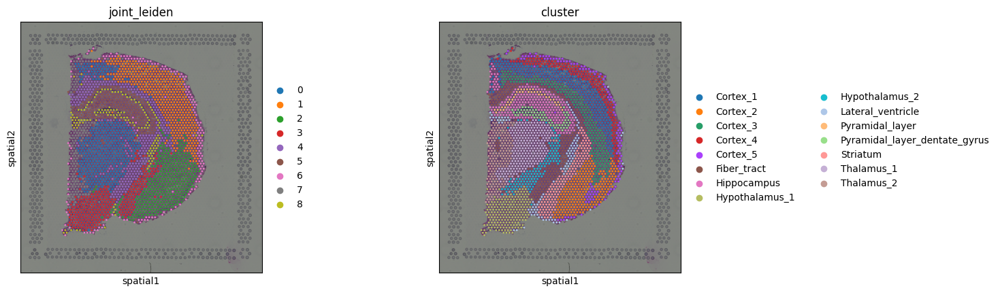

In [15]:
sq.pl.spatial_scatter(adata, color=["joint_leiden","cluster"])

In [16]:
sq.gr.spatial_neighbors(adata)
adata.obsp

PairwiseArrays with keys: connectivities, distances, spatial_connectivities, spatial_distances

In [17]:
# Change to spatial_connectivities, combine the spatial feature and gene expression similarities
joint_adj=adata.obsp["spatial_connectivities"] + adata.obsp["connectivities"]
sc.tl.leiden(adata, adjacency=joint_adj, key_added="joint_leiden_graph")

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' i

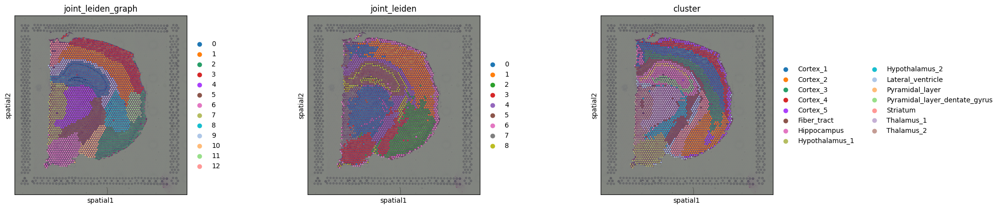

In [18]:
sq.pl.spatial_scatter(adata, color=["joint_leiden_graph","joint_leiden","cluster"])

# gene expression have the same weighing as spatial connective graph(?)

In [19]:
# Used the scale

joint_adj=0.3*adata.obsp["spatial_connectivities"] + adata.obsp["connectivities"]
sc.tl.leiden(adata, adjacency=joint_adj, key_added="joint_leiden_graph")

In [20]:
adata.uns.pop("joint_leiden_graph_colors")

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896']

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' i

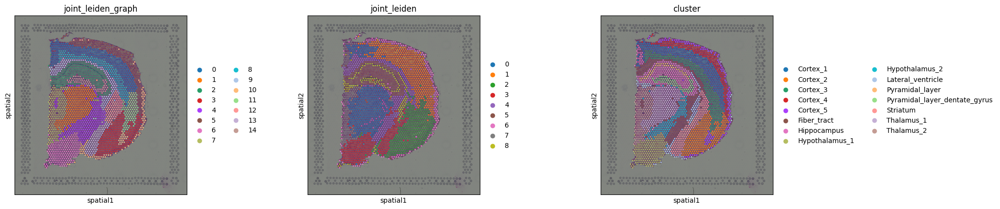

In [21]:
sq.pl.spatial_scatter(adata, color=["joint_leiden_graph","joint_leiden","cluster"])

# try to find the balance between leiden clusting computing on graph representation and gene expression representation 

### KNN & ARI

In [22]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,n_counts,leiden,cluster,features_cluster,joint_leiden,joint_leiden_graph
AAACAAGTATCTCCCA-1,1,50,102,4928,8.502891,19340.0,9.869983,38.428128,43.133402,49.214064,60.449845,3857.0,8.257904,19.943123,19340.0,2,Cortex_2,14,2,3
AAACAATCTACTAGCA-1,1,3,43,3448,8.145840,13750.0,9.528867,50.516364,55.141818,60.952727,70.574545,3267.0,8.091933,23.760000,13750.0,11,Cortex_5,5,6,5
AAACACCAATAACTGC-1,1,59,19,6022,8.703341,32710.0,10.395467,40.483033,47.071232,54.564353,65.087129,4910.0,8.499233,15.010699,32710.0,7,Thalamus_2,1,7,7
AAACAGAGCGACTCCT-1,1,14,94,4311,8.369157,15909.0,9.674704,40.957948,45.810547,52.077440,62.976931,3270.0,8.092851,20.554403,15909.0,11,Cortex_5,13,6,5
AAACCGGGTAGGTACC-1,1,42,28,5787,8.663542,31856.0,10.369013,40.287544,45.887745,52.982170,64.248493,6693.0,8.808967,21.010170,31856.0,7,Thalamus_2,2,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,7016,8.856091,34390.0,10.445550,30.994475,37.758069,45.891247,57.321896,4002.0,8.294800,11.637104,34390.0,12,Lateral_ventricle,0,8,9
TTGTTTCACATCCAGG-1,1,58,42,6995,8.853094,44372.0,10.700386,33.284504,40.203281,48.906968,61.421617,5739.0,8.655214,12.933832,44372.0,6,Hypothalamus_1,12,3,6
TTGTTTCATTAGTCTA-1,1,60,30,5082,8.533657,24432.0,10.103690,38.506876,45.640963,53.675508,65.307793,3560.0,8.177796,14.571054,24432.0,6,Hypothalamus_1,4,3,6
TTGTTTCCATACAACT-1,1,45,27,5661,8.641532,27381.0,10.217641,36.886892,42.441839,49.589131,60.998503,5296.0,8.574896,19.341881,27381.0,7,Thalamus_2,7,0,7


In [23]:
adata.obs["cluster"]

AAACAAGTATCTCCCA-1             Cortex_2
AAACAATCTACTAGCA-1             Cortex_5
AAACACCAATAACTGC-1           Thalamus_2
AAACAGAGCGACTCCT-1             Cortex_5
AAACCGGGTAGGTACC-1           Thalamus_2
                            ...        
TTGTTGTGTGTCAAGA-1    Lateral_ventricle
TTGTTTCACATCCAGG-1       Hypothalamus_1
TTGTTTCATTAGTCTA-1       Hypothalamus_1
TTGTTTCCATACAACT-1           Thalamus_2
TTGTTTGTGTAAATTC-1             Cortex_4
Name: cluster, Length: 2688, dtype: category
Categories (15, object): ['Cortex_1', 'Cortex_2', 'Cortex_3', 'Cortex_4', ..., 'Pyramidal_layer_dentate_gyrus', 'Striatum', 'Thalamus_1', 'Thalamus_2']

## Spatial statistics and graph analysis

Similar to other spatial data, we can investigate spatial organization by leveraging spatial and graph statistics in Visium data.

Neighborhood enrichment

Computing a neighborhood enrichment can help us identify spots clusters that share a common neighborhood structure across the tissue. We can compute such score with the following function: **squidpy.gr.nhood_enrichment()**. In short, it’s an enrichment score on spatial proximity of clusters: if spots belonging to two different clusters are often close to each other, then they will have a high score and can be defined as being enriched. On the other hand, if they are far apart, and therefore are seldom a neighborhood, the score will be low and they can be defined as depleted. This score is based on a permutation-based test, and you can set the number of permutations with the **n_perms** argument (default is 1000).

Since the function works on a connectivity matrix, we need to compute that as well. This can be done with **squidpy.gr.spatial_neighbors()**. Please see Building spatial neighbors graph for more details of how this function works.

Finally, we’ll directly visualize the results with **squidpy.pl.nhood_enrichment()**.



In [55]:
sq.gr.spatial_neighbors(adata)
sq.gr.nhood_enrichment(adata, cluster_key="cluster")


  0%|          | 0/1000 [00:00<?, ?/s]

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_utils.py:557: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  row_labels = adata.obs[key][row_order]


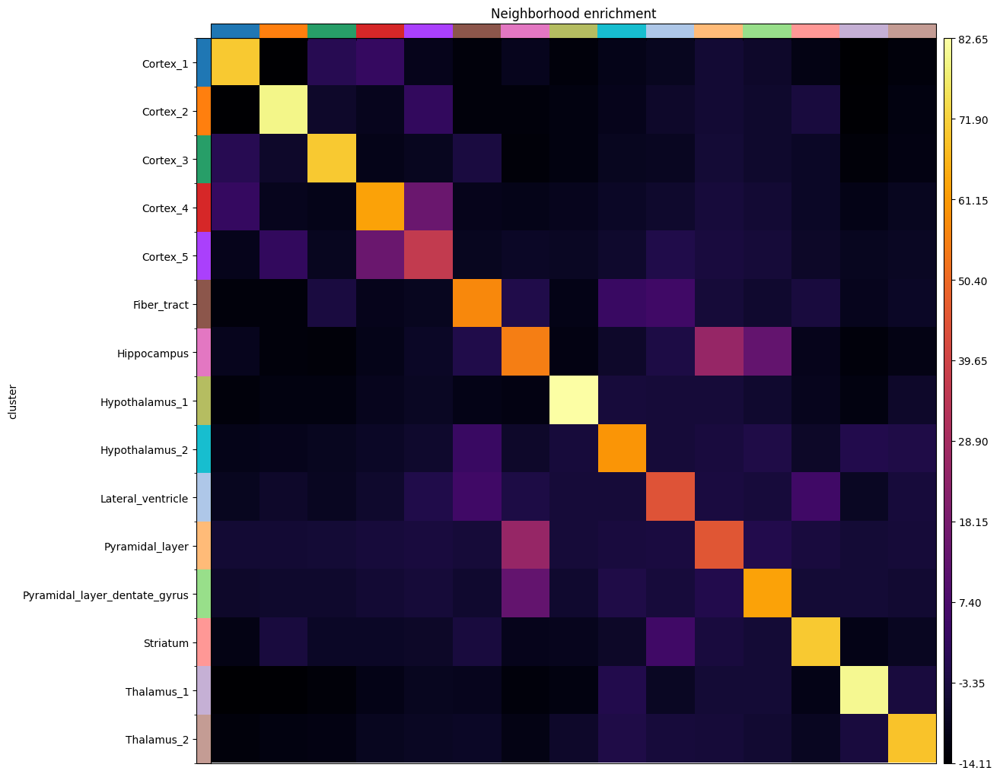

In [56]:
sq.pl.nhood_enrichment(adata, cluster_key="cluster", cmap="inferno")

In [57]:
adata

AnnData object with n_obs × n_vars = 2688 × 18078
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster', 'features_cluster', 'joint_leiden', 'joint_leiden_graph'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'spatial', 'umap', 'features_cluster_colors', 'joint_leiden', 'joint_leiden_colors', 'spatial_neighbors', 'joint_leiden_graph', 'joint_leiden_graph_colors', 'cluster_nhood_e

Interpretion of the enrichment result:

Given the spatial organization of the mouse brain coronal section, not surprisingly we find high neighborhood enrichment the **Hippocampus** region: **Pyramidal_layer_dentate_gyrus** and **Pyramidal_layer** clusters seems to be often neighbors with the larger Hippocampus cluster.

## Co-occurrence across spatial dimensions

In addition to the neighbor enrichment score, we can visualize cluster co-occurrence in spatial dimensions. 

This is a similar analysis of the one presented above, yet it does not operate on the connectivity matrix, but on the original spatial coordinates. The co-occurrence score is defined as:
$$
\frac{p(exp|cond)}{p(exp)}
$$

where **p(exp|cond)** is the conditional probability of observing a cluster **exp** conditioned on the presence of a cluster, whereas 
**p(exp)** is the probability of observing **exp** in the radius size of interest.

The score is computed across increasing radii size around each observation (i.e. spots here) in the tissue.

We are gonna compute such score with **squidpy.gr.co_occurrence()** and set the cluster annotation for the conditional probability with the argument **clusters**. Then, we visualize the results with **squidpy.pl.co_occurrence()**.

  0%|          | 0/1 [00:00<?, ?/s]

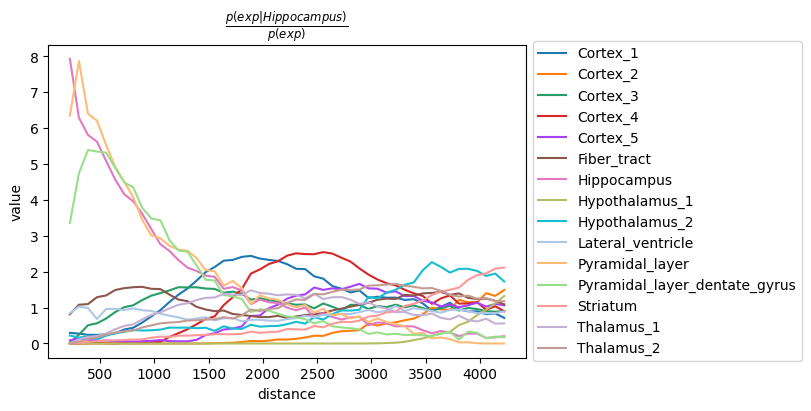

In [58]:
sq.gr.co_occurrence(adata, cluster_key="cluster")
sq.pl.co_occurrence(
    adata,
    cluster_key="cluster",
    clusters="Hippocampus",
    figsize=(8, 4),
)

  0%|          | 0/1 [00:00<?, ?/s]

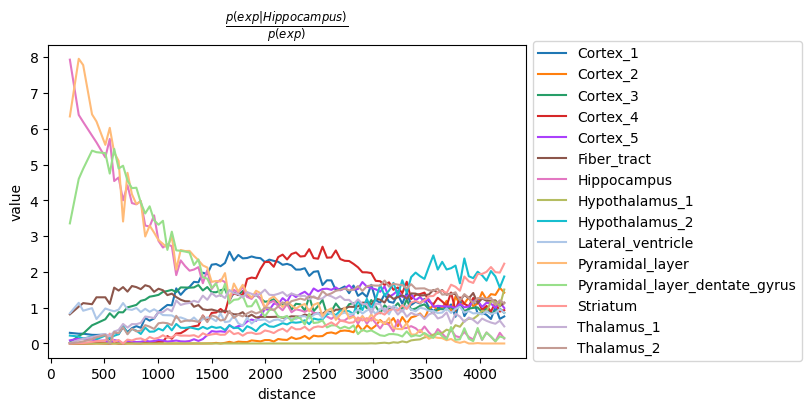

In [59]:
# interval(default: 50): calculate the distances interval at which co-occurrence;
# 确定多大距离范围内的簇被认为是邻居。较小的值会检测近距离的相邻簇，较大的值会检测较远距离的相邻簇。

sq.gr.co_occurrence(adata, cluster_key="cluster", interval=100)
sq.pl.co_occurrence(
    adata,
    cluster_key="cluster",
    clusters="Hippocampus",
    figsize=(8, 4),
)

  0%|          | 0/1 [00:00<?, ?/s]

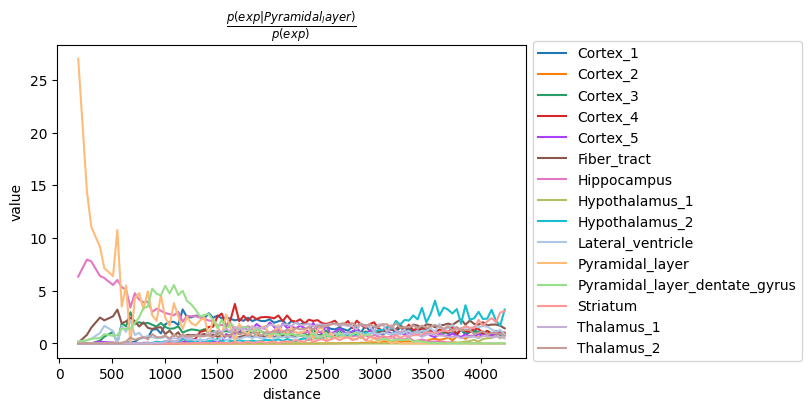

In [60]:
sq.gr.co_occurrence(adata, cluster_key="cluster", interval=100)
sq.pl.co_occurrence(
    adata,
    cluster_key="cluster",
    clusters="Pyramidal_layer",
    figsize=(8, 4),
)

## Ligand-receptor interaction analysis

We are continuing the analysis showing couple of feature-level methods that are very relevant for the analysis of spatial molecular data. 

For instance, after quantification of cluster co-occurrence, we might be interested in finding molecular instances that could potentially drive cellular communication. This naturally translates in a ligand-receptor interaction analysis. 

In Squidpy, we provide a fast re-implementation the popular method **CellPhoneDB** [Efremova et al., 2020] and extended its database of annotated ligand-receptor interaction pairs with the popular database Omnipath [Türei et al., 2016]. 

You can run the analysis for all clusters pairs, and all genes (in seconds, without leaving this notebook), with **squidpy.gr.ligrec()**. Furthermore, we’ll directly visualize the results, filtering out lowly-expressed genes (with the **means_range** argument) and increasing the threshold for the adjusted p-value (with the **alpha** argument). We’ll also subset the visualization for only one source group, the Hippocampus cluster, and two target groups, **Pyramidal_layer_dentate_gyrus and Pyramidal_layer cluster.**

* Two-step analysis

In [84]:
adata

AnnData object with n_obs × n_vars = 3861 × 19685
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'clusters', 'clusters_colors', 'rank_genes_groups', 'dendrogram_clusters'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [85]:
sq.gr.ligrec(
    adata,
    n_perms=10,
    cluster_key="clusters",
    n_job=2,
    use_raw=False
)

Fetching interactions from `omnipath`
Fetched `10935` interactions
    Finish (0:00:03)
Running `10` permutations on `6639` interactions and `100` cluster combinations using `1` core(s)


/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/gr/_ligrec.py:733: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = data.groupby("clusters")


  0%|          | 0/10 [00:00<?, ?permutation/s]

Adding `adata.uns['clusters_ligrec']`
Finish (0:00:16)


In [62]:
sq.pl.ligrec(
    adata,
    cluster_key="cluster",
    source_groups="Hippocampus",
    target_groups=["Pyramidal_layer", "Pyramidal_layer_dentate_gyrus"],
    means_range=(3, np.inf),
    alpha=1e-4,
    swap_axes=True,
)

ValueError: After removing rows with only NaN interactions, none remain.

In [ ]:
ligrec_results = adata.uns['cluster_ligrec']

# exam p value and means 
pvals = ligrec_results['pvalues']
means = ligrec_results['means']

print(pvals.head())
print(means.head())

cluster_1     Cortex_1                                                  \
cluster_2     Cortex_1 Cortex_2 Cortex_3 Cortex_4 Cortex_5 Fiber_tract   
source target                                                            
EPOR   TRPC3       NaN      NaN      NaN      NaN      NaN         NaN   
FYN    TRPC4       NaN      NaN      NaN      NaN      NaN         NaN   
       TRPC6       NaN      NaN      NaN      NaN      NaN         NaN   
       TRPV4       NaN      NaN      NaN      NaN      NaN         NaN   
       TRPV6       NaN      NaN      NaN      NaN      NaN         NaN   

cluster_1                                                                  \
cluster_2     Hippocampus Hypothalamus_1 Hypothalamus_2 Lateral_ventricle   
source target                                                               
EPOR   TRPC3          NaN            NaN            NaN               NaN   
FYN    TRPC4          NaN            NaN            NaN               NaN   
       TRPC6          

In [ ]:
sq.pl.ligrec(
    adata,
    cluster_key="cluster",
    source_groups="Hippocampus",
    target_groups=["Pyramidal_layer", "Pyramidal_layer_dentate_gyrus"],
    means_range=(0, np.inf),  #  board the restriction of means_range value
    alpha=0.05,  # board alpha value
    swap_axes=True,
)

ValueError: After removing rows with only NaN interactions, none remain.

### Exercice 

Above, we looked at the neighborhood enrichment analysis, which calculates an enrichment value based on cluster proximity. On the other hand, the ligand receptor interaction analysis provide a differerent view on the putative cellular communication process, by measuring co-expression of receptor-ligand pairs. We can visualize such interaction score in a similar view as the neighborhood enrichment, by "counting" the number of significant interactions between cluters.

Couple of things to consider:

* the result of the **ligrec** method is saved in **adata. uns ["leiden_ligre"]** with keys **means** and **pvalues**.
* **numpy.masked_arrays** might be useful for this task.
* if you save the resulting "counting" matrix in **adata.uns ["leiden_interactions"]** you can then visualize it with **sq.pl.interaction_matrix.**

Hint

```python
clusters = adata.obs.leiden.cat.categories
pval = adata.uns ["cluster_ligrec"] ["pvalues"]
means = adata.uns ["cluster_ligrec"] ["means"]
interactions = np.ma.masked_where((pval < 1e-5) & (means > 2), means).mask. sum (0) 

interactions = np. reshape (interactions, (clusters. shape [0], clusters. shape [0]))
adata. uns ["cluster_interactions"] = interactions
sq. pl. interaction_matrix(adata, cluster_key="cluster", cmap="inferno")
```

In [ ]:
adata.uns["cluster_ligrec"]["means"]

cluster_1      Cortex_1                                                      \
cluster_2      Cortex_1  Cortex_2  Cortex_3  Cortex_4  Cortex_5 Fiber_tract   
source target                                                                 
EPOR   TRPC3   0.315141  0.150374  0.244891  0.190613  0.107422    0.101848   
FYN    TRPC4   1.257042  1.265722  1.194614  1.185718  1.139112    1.115839   
       TRPC6   1.176056  1.174282   1.18027  1.332059  1.162368    1.124688   
       TRPV4   1.116197  1.119807  1.118795  1.115596  1.119732    1.124688   
       TRPV6   1.114437  1.102298  1.133139  1.109498         0    1.102565   
...                 ...       ...       ...       ...       ...         ...   
IFNG   GRIA1          0         0         0         0         0           0   
CXCL12 ESR2           0  0.625185  0.627338         0         0           0   
FYN    F2R     1.144366  1.150936  1.143385  1.118645  1.135236    1.149025   
IL1B   NR2C2   0.806338  0.807674  0.790435  0.835967  0.291039    0.221597   
FYN    GRM1    1.415493  1.715138  1.448713  1.557669  1.282523    1.250795   

cluster_1                                                                  \
cluster_2     Hippocampus Hypothalamus_1 Hypothalamus_2 Lateral_ventricle   
source target                                                               
EPOR   TRPC3     0.084428       0.133566       0.147609          0.130567   
FYN    TRPC4     1.176929       1.227756       1.126668          1.167019   
       TRPC6     1.174676       1.162852       1.107871          1.114638   
       TRPV4     1.109361       1.112371       1.119149          1.947971   
       TRPV6     1.104857              0              0                 0   
...                   ...            ...            ...               ...   
IFNG   GRIA1            0              0              0                 0   
CXCL12 ESR2             0       0.625643              0                 0   
FYN    F2R       1.140893       1.345544       1.194337          1.200352   
IL1B   NR2C2     0.252332        0.66248       0.459454          0.425369   
FYN    GRM1      1.289541       1.597948       1.705615          1.338447   

cluster_1      ...  Thalamus_2                                            \
cluster_2      ... Fiber_tract Hippocampus Hypothalamus_1 Hypothalamus_2   
source target  ...                                                         
EPOR   TRPC3   ...    0.095686    0.078266       0.127404       0.141447   
FYN    TRPC4   ...    1.460799    1.521889       1.572716       1.471628   
       TRPC6   ...    1.469649    1.519637       1.507812       1.452831   
       TRPV4   ...    1.469649    1.454322       1.457332       1.464109   
       TRPV6   ...    1.447525    1.449817              0              0   
...            ...         ...         ...            ...            ...   
IFNG   GRIA1   ...    0.511454    1.685037       2.584335       1.480048   
CXCL12 ESR2    ...           0           0       0.364383              0   
FYN    F2R     ...    1.493985    1.485853       1.690505       1.539297   
IL1B   NR2C2   ...    0.210961    0.241695       0.651843       0.448817   
FYN    GRM1    ...    1.595755    1.634502       1.942909       2.050576   

cluster_1                                                                      \
cluster_2     Lateral_ventricle Pyramidal_layer Pyramidal_layer_dentate_gyrus   
source target                                                                   
EPOR   TRPC3           0.124405        0.169643                      0.128676   
FYN    TRPC4           1.511979        2.623884                      2.040901   
       TRPC6           1.459598        1.576265                       2.06296   
       TRPV4           2.292932        1.469122                      1.474724   
       TRPV6                  0               0                      1.452665   
...                         ...             ...                           ...   
IFNG   GRIA1        

In [ ]:
clusters = adata.obs.leiden.cat.categories
pval = adata.uns ["cluster_ligrec"] ["pvalues"]
means = adata.uns ["cluster_ligrec"] ["means"]
interactions = np.ma.masked_where((pval < 1e-5) & (means > 2), means).mask. sum (0) 

In [ ]:
interactions

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,   

In [ ]:
interactions.shape

(225,)

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_utils.py:557: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  row_labels = adata.obs[key][row_order]


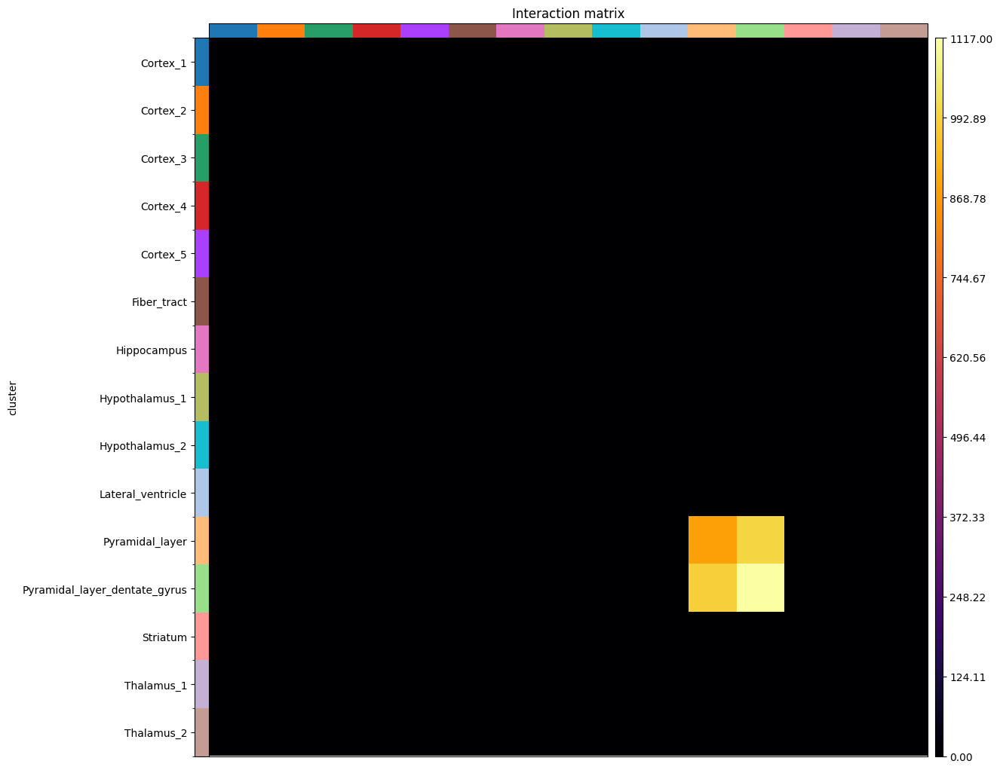

In [ ]:
interactions = np. reshape (interactions, (clusters. shape [0], clusters. shape [0]))
adata. uns ["cluster_interactions"] = interactions
sq. pl. interaction_matrix(adata, cluster_key="cluster", cmap="inferno")

In [ ]:
# clusters = adata.obs.leiden.cat.categories
# pval = adata.uns ["cluster_ligrec"] ["pvalues"]
# means = adata.uns ["cluster_ligrec"] ["means"]
# interactions = np.ma.masked_where((pval < 1e-5) & (means > 2), means).mask. sum (0) 

# interactions = np. reshape (interactions, (clusters. shape [0], clusters. shape [0]))
# adata. uns ["cluster_interactions"] = interactions
# sq. pl. interaction_matrix(adata, cluster_key="cluster", cmap="inferno")

## Spatially variable genes with Moran’s I

Finally, we might be interested in finding genes that show spatial patterns. 

There are several methods that aimed at address this explicitly, based on point processes or Gaussian process regression framework:

* SPARK - paper <https://www.nature.com/articles/s41592-019-0701-7#Abs1>, code <https://github.com/xzhoulab/SPARK>.

* Spatial DE - paper <https://www.nature.com/articles/nmeth.4636>, code <https://github.com/Teichlab/SpatialDE>.

* trendsceek - paper <https://www.nature.com/articles/nmeth.4634>, code <https://github.com/edsgard/trendsceek>.

* HMRF - paper <https://www.nature.com/articles/nbt.4260>, code <https://bitbucket.org/qzhudfci/smfishhmrf-py>.

Here, we provide a simple approach based on the well-known **Moran's I statistics** <https://en.wikipedia.org/wiki/Moran%27s_I>_ which is in fact used also as a baseline method in the spatially variable gene papers listed above. The function in Squidpy is called  **squidpy.gr.spatial_autocorr()**, and returns both test statistics and adjusted p-values in** anndata.AnnData.var** slot. For time reasons, we will evaluate a subset of the highly variable genes only.



In [63]:
genes = adata[:, adata.var.highly_variable].var_names.values[:1000]
sq.gr.spatial_autocorr(
    adata,
    mode="moran",
    genes=genes,
    n_perms=100,
    n_jobs=1,
)

  0%|          | 0/100 [00:00<?, ?/s]

The results are saved in **adata.uns['moranI']** slot. Genes have already been sorted by Moran’s I statistic.



In [64]:
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
Olfm1,0.763291,0.0,0.000131,0.0,0.009901,0.000293,0.0,0.0,0.011648
Plp1,0.747660,0.0,0.000131,0.0,0.009901,0.000340,0.0,0.0,0.011648
Itpka,0.727076,0.0,0.000131,0.0,0.009901,0.000261,0.0,0.0,0.011648
Snap25,0.720987,0.0,0.000131,0.0,0.009901,0.000284,0.0,0.0,0.011648
Nnat,0.708637,0.0,0.000131,0.0,0.009901,0.000246,0.0,0.0,0.011648
Ppp3ca,0.693320,0.0,0.000131,0.0,0.009901,0.000278,0.0,0.0,0.011648
Chn1,0.684957,0.0,0.000131,0.0,0.009901,0.000245,0.0,0.0,0.011648
Mal,0.679775,0.0,0.000131,0.0,0.009901,0.000321,0.0,0.0,0.011648
Tmsb4x,0.676719,0.0,0.000131,0.0,0.009901,0.000206,0.0,0.0,0.011648
Cldn11,0.674110,0.0,0.000131,0.0,0.009901,0.000309,0.0,0.0,0.011648


We can select few genes and visualize their expression levels in the tissue with **squidpy.pl.spatial_scatter()**.

/Users/rabbit/Library/Python/3.9/lib/python/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


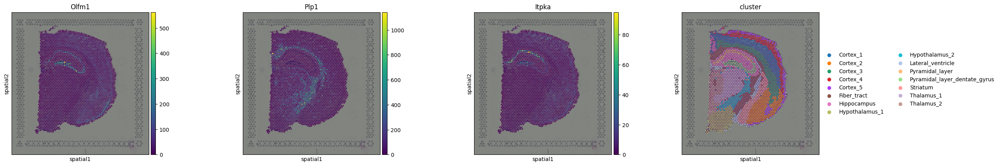

In [65]:
sq.pl.spatial_scatter(adata, color=["Olfm1", "Plp1", "Itpka", "cluster"])